### Working with a NDVI Coimbatore Image  

In [58]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np

In [59]:
with rasterio.open('Sentinel_NDVI_Coimbatore.tif') as src:
    ndvi = src.read(1)  
    num_bands = src.count  
print(f'Number of bands: {num_bands}')

Number of bands: 1


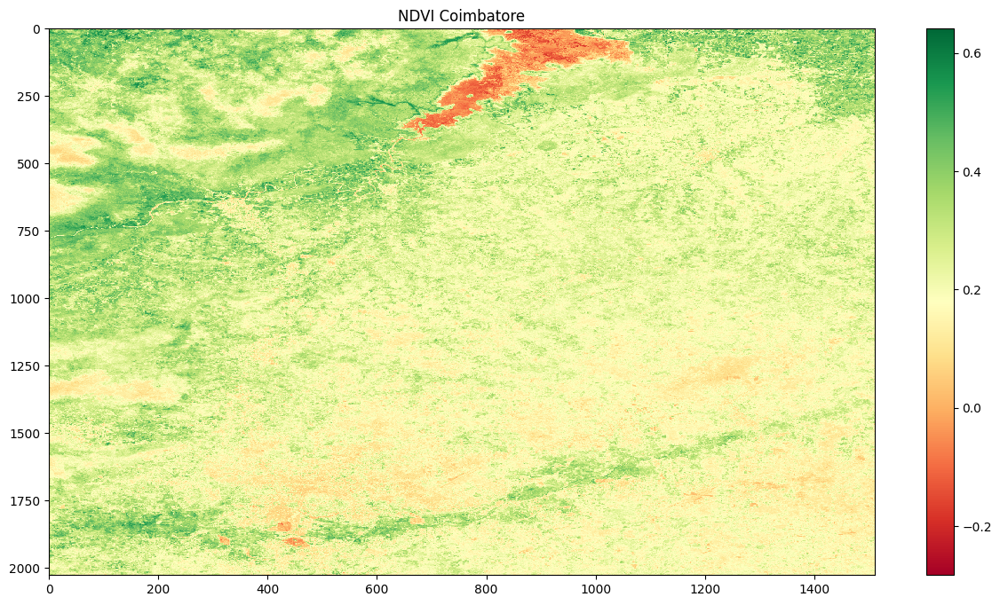

In [60]:
plt.figure(figsize= (15,8))
plt.imshow(ndvi, interpolation='nearest', aspect='auto',cmap = 'RdYlGn')
plt.colorbar()
plt.title('NDVI Coimbatore')
plt.show()

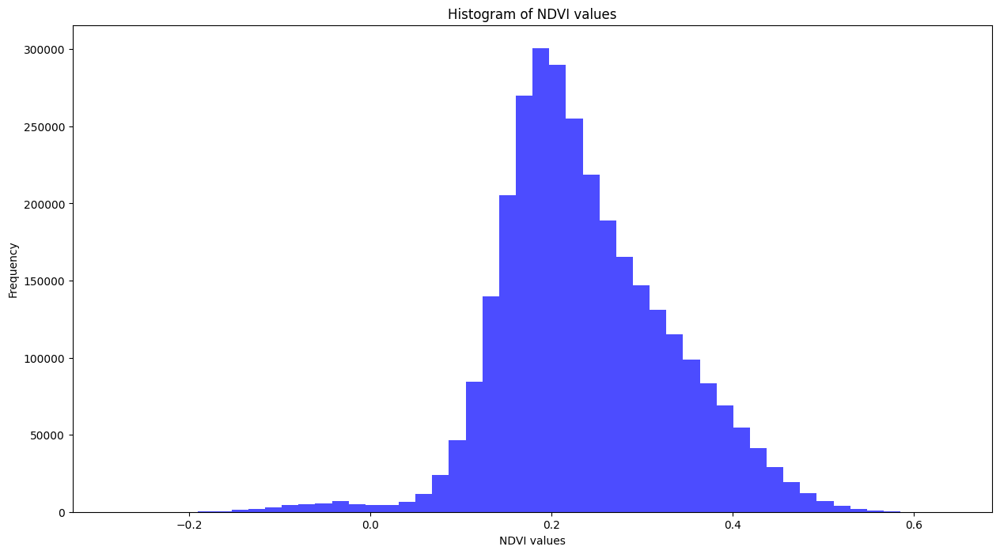

In [61]:
plt.figure(figsize= (15,8))
plt.hist(ndvi.flatten(), bins=50, color='blue', alpha=0.7)
plt.title('Histogram of NDVI values')
plt.xlabel('NDVI values')
plt.ylabel('Frequency')
plt.show()

### Histogram equalization is done to increase the contrast of the image

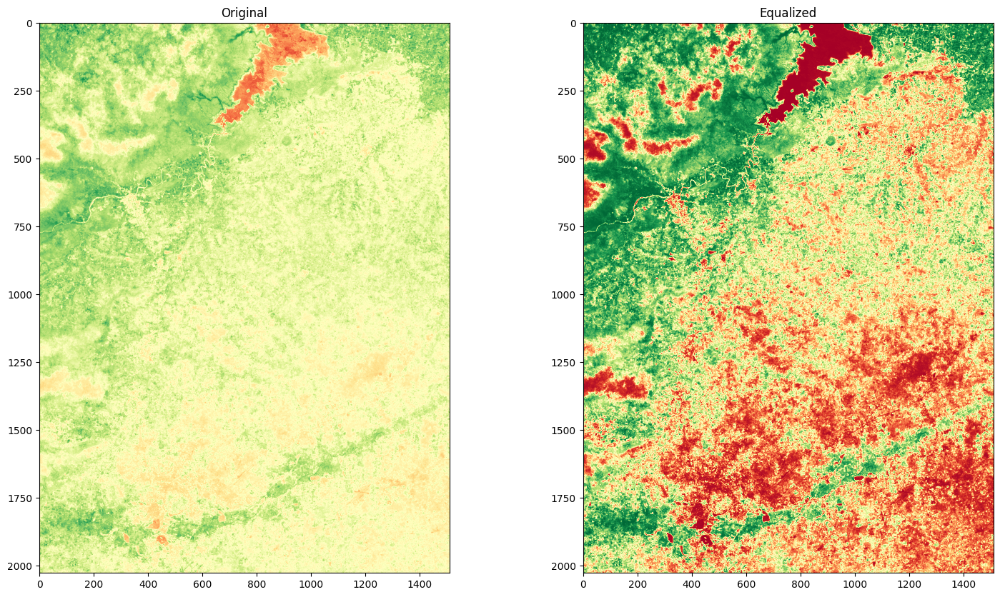

In [118]:
from skimage import exposure
import matplotlib.pyplot as plt

# Open the image with rasterio
with rasterio.open('Sentinel_NDVI_Coimbatore.tif') as src:
    ndvi = src.read(1)

# Perform histogram equalization
ndvi_equalized = exposure.equalize_hist(ndvi)

# Display the original and equalized images
plt.figure(figsize=(18, 10))
plt.subplot(121), plt.imshow(ndvi, cmap='RdYlGn'), plt.title('Original')
plt.subplot(122), plt.imshow(ndvi_equalized, cmap='RdYlGn'), plt.title('Equalized')
plt.show()

In [62]:
ndvi.flatten().max()

0.6408602

In [63]:
ndvi.flatten().min()

-0.28234825

In [64]:
np.mean(ndvi)

0.23716849

#### Harris Corner Detection

In [119]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

ndvi_normalized = ((ndvi_equalized - ndvi_equalized.min()) / (ndvi_equalized.max() - ndvi_equalized.min()) * 255).astype(np.uint8)

# OpenCV has the function cv.cornerHarris() for this purpose. Its arguments are:
# img - Input image. It should be grayscale and float32 type.
# blockSize - It is the size of neighbourhood considered for corner detection
# ksize - Aperture parameter of the Sobel derivative used.
# k - Harris detector free parameter in the equation.


dst = cv2.cornerHarris(ndvi.astype(np.float32), 5, 5, 0.04)

In [120]:
dst

array([[ 3.4687408e-05,  6.6255656e-05,  9.7521202e-05, ...,
        -7.3633346e-05, -1.3022931e-04, -2.1140664e-04],
       [ 6.5957029e-05,  1.0539325e-04,  1.3421521e-04, ...,
         1.1923470e-04, -3.9185164e-05, -1.7316169e-04],
       [ 8.5359119e-05,  1.3048289e-04,  1.4740048e-04, ...,
         8.5479871e-04,  4.0230693e-04, -1.1758006e-05],
       ...,
       [ 1.6705937e-05,  2.5200436e-05,  4.2474567e-05, ...,
         3.5151163e-07,  2.6267347e-07,  3.4963858e-07],
       [ 5.5040377e-06,  1.4538071e-05,  2.1555714e-05, ...,
         5.0818761e-07,  4.1080821e-07,  5.2093799e-07],
       [ 7.3963565e-07,  7.0641290e-06,  9.7902221e-06, ...,
         4.1095910e-07,  3.7104041e-07,  4.1205192e-07]], dtype=float32)

In [121]:
corners = dst > 0.03 * dst.max()
corners.shape

(2027, 1511)

In [122]:
coord = np.argwhere(corners)
coord

array([[   0,  896],
       [   0,  897],
       [   0, 1110],
       ...,
       [2026,  527],
       [2026,  566],
       [2026,  567]])

Text(0.5, 1.0, 'Harris Corner Detection')

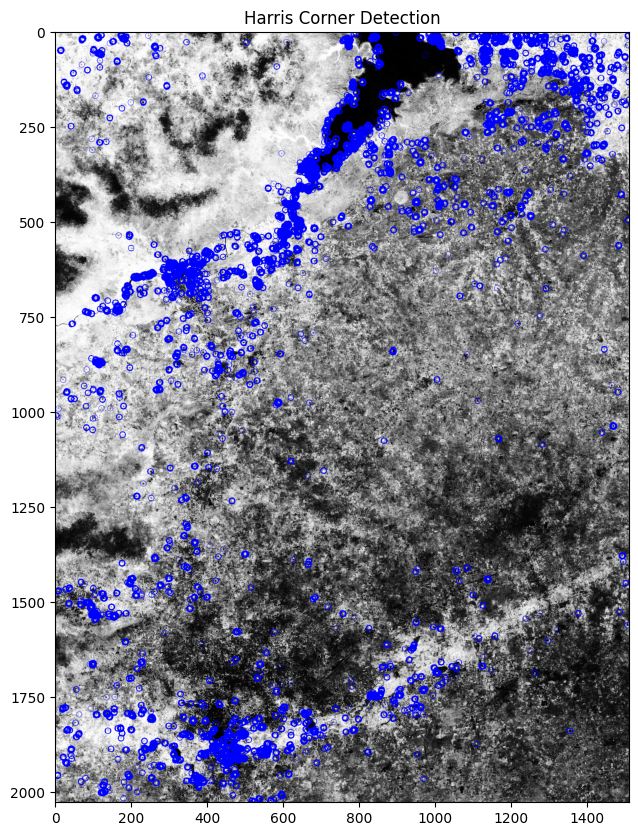

In [123]:
# Draw circles on the coordinates to mark the corners
ndvi_colored = cv2.cvtColor(ndvi_normalized, cv2.COLOR_GRAY2BGR)
for y, x in coord:
    cv2.circle(ndvi_colored, (x, y), 8, (0, 0, 255, 5))

plt.figure(figsize=(10,10))
plt.imshow(ndvi_colored)
plt.title('Harris Corner Detection')

In [124]:
corners = dst > 0.07 * dst.max()
corners.shape

(2027, 1511)

In [125]:
coord = np.argwhere(corners)
coord

array([[   0, 1134],
       [   0, 1135],
       [   0, 1136],
       ...,
       [2002,  125],
       [2002,  126],
       [2003,  125]])

Text(0.5, 1.0, 'Harris Corner Detection')

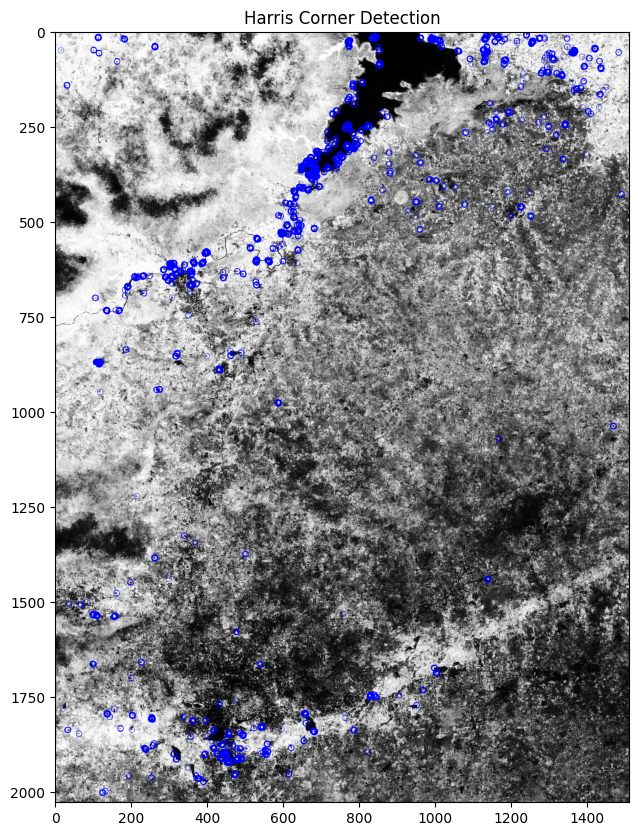

In [126]:
# Draw circles on the coordinates to mark the corners
ndvi_colored = cv2.cvtColor(ndvi_normalized, cv2.COLOR_GRAY2BGR)
for y, x in coord:
    cv2.circle(ndvi_colored, (x, y), 8, (0, 0, 255, 5))

plt.figure(figsize=(10,10))
plt.imshow(ndvi_colored)
plt.title('Harris Corner Detection')


### Canny Edge detection

In [149]:
ndvi_normalized = ((ndvi - ndvi.min()) / (ndvi.max() - ndvi.min()) * 255).astype(np.uint8)

In [150]:
ndvi_gray = ndvi_normalized

# First argument is our input image. Second and third arguments are our minVal and maxVal respectively. Fourth argument is aperture_size. It is the size of Sobel kernel used for find image gradients. By default it is 3. Last argument is L2gradient which specifies the equation for finding gradient magnitude.
# edges = cv2.Canny(ndvi_gray, 100, 200)


# Apply Gaussian blur to the image
ndvi_blurred = cv2.GaussianBlur(ndvi_gray, (5, 5), 0)




In [151]:
ndvi_blurred.min()

26

In [152]:
ndvi_blurred.max()

244

In [153]:
np.mean(ndvi_blurred)

142.99801227440147

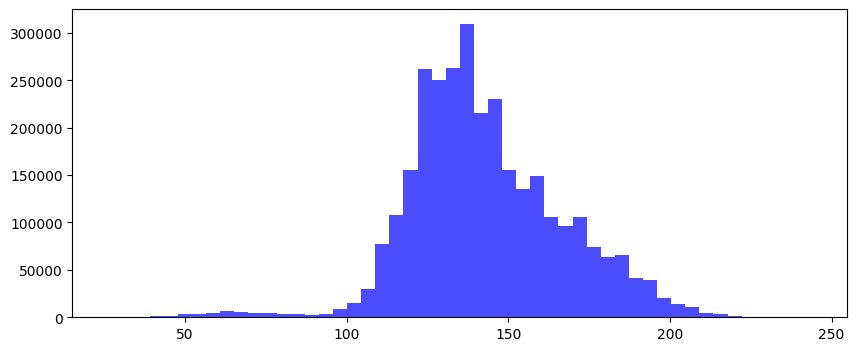

In [158]:
plt.figure(figsize=(10, 4))
plt.hist(ndvi_blurred.flatten(), bins=50, color='blue', alpha=0.7)
plt.show()

In [145]:
edges = cv2.Canny(ndvi_blurred, 100, 150)

_, thresholded = cv2.threshold(edges, 127, 255, cv2.THRESH_BINARY)

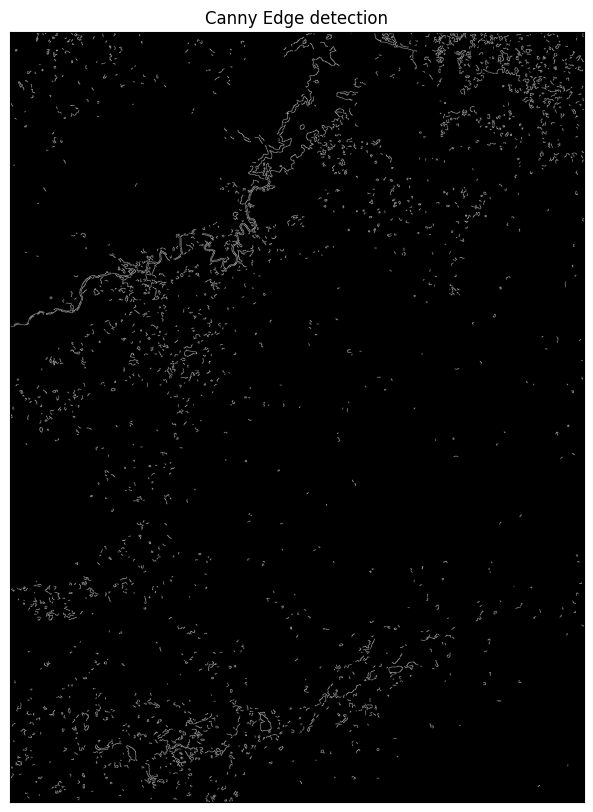

In [159]:
plt.figure(figsize=(10, 10))
plt.imshow(thresholded, cmap='gray')
plt.title('Canny Edge detection'), plt.xticks([]), plt.yticks([])

plt.show()

### Working with composite coimbatore with all bands - for my purposes

In [24]:
import rasterio

# Open the image
with rasterio.open('Composite_Coimbatore_rect.tif') as src:
    num_bands = src.count

print(f'Number of bands: {num_bands}')

Number of bands: 16


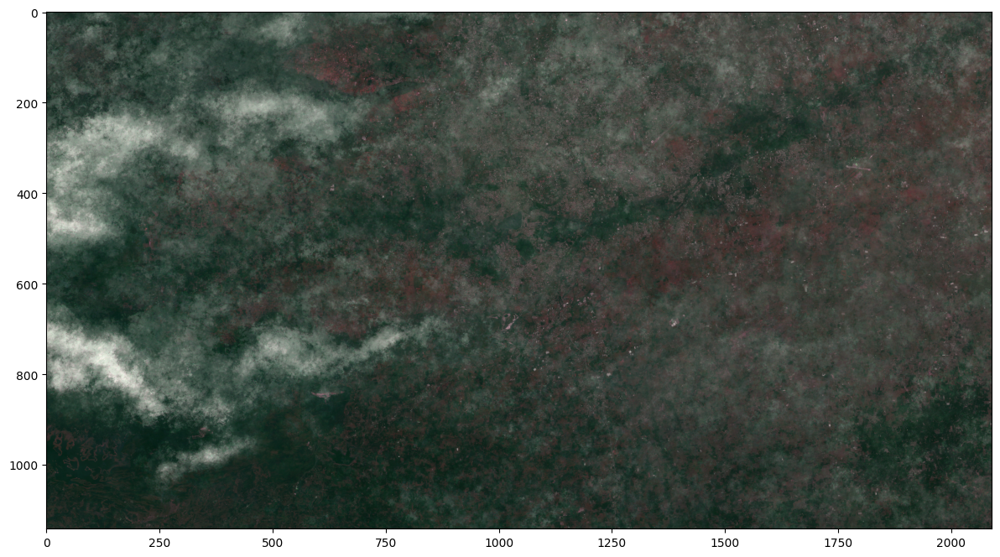

In [29]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np

# Open the image
with rasterio.open('Composite_Coimbatore_rect.tif') as src:
    # Read the bands of the image
    band1 = src.read(2)  # Blue band
    band2 = src.read(3)  # Green band
    band3 = src.read(4)  # Red band

# Create a false color composite
false_color = np.dstack((band3, band1, band2))

# Normalize the bands to range between 0 and 1
false_color = (false_color - false_color.min()) / (false_color.max() - false_color.min())

# Display the image
plt.figure(figsize=(15, 8))
plt.imshow(false_color)
plt.show()

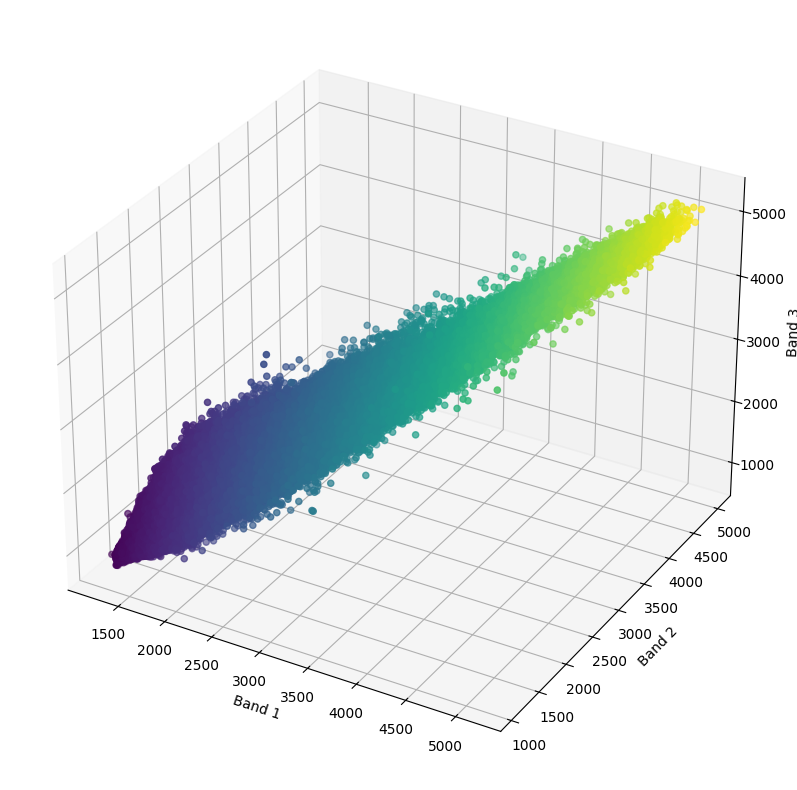

In [28]:
from mpl_toolkits.mplot3d import Axes3D

# Open the image
with rasterio.open('Composite_Coimbatore_rect.tif') as src:
    # Read the bands of the image
    band1 = src.read(2)  # Blue band
    band2 = src.read(3)  # Green band
    band3 = src.read(4)  # Red band

# Flatten the bands
band1 = band1.flatten()
band2 = band2.flatten()
band3 = band3.flatten()

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(band1, band2, band3, c=band1, marker='o')

ax.set_xlabel('Band 1')
ax.set_ylabel('Band 2')
ax.set_zlabel('Band 3')

plt.show()

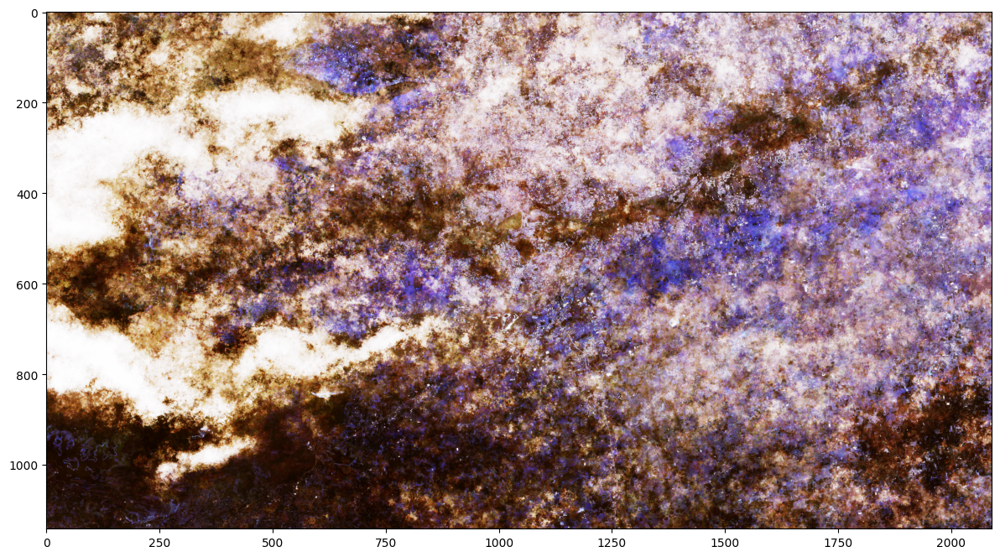

In [26]:
from skimage import exposure
import rasterio
import matplotlib.pyplot as plt
import numpy as np

# Open the image
with rasterio.open('Composite_Coimbatore_rect.tif') as src:
    # Read the bands of the image
    band1 = src.read(2)  # Red band
    band2 = src.read(3)  # Green band
    band3 = src.read(4)  # Near-infrared band

# Stack the bands together
image = np.dstack((band1, band2, band3))

# Perform histogram equalization
image_eq = exposure.equalize_hist(image)

# Display the equalized image
plt.figure(figsize=(15, 8))
plt.imshow(image_eq)
plt.show()

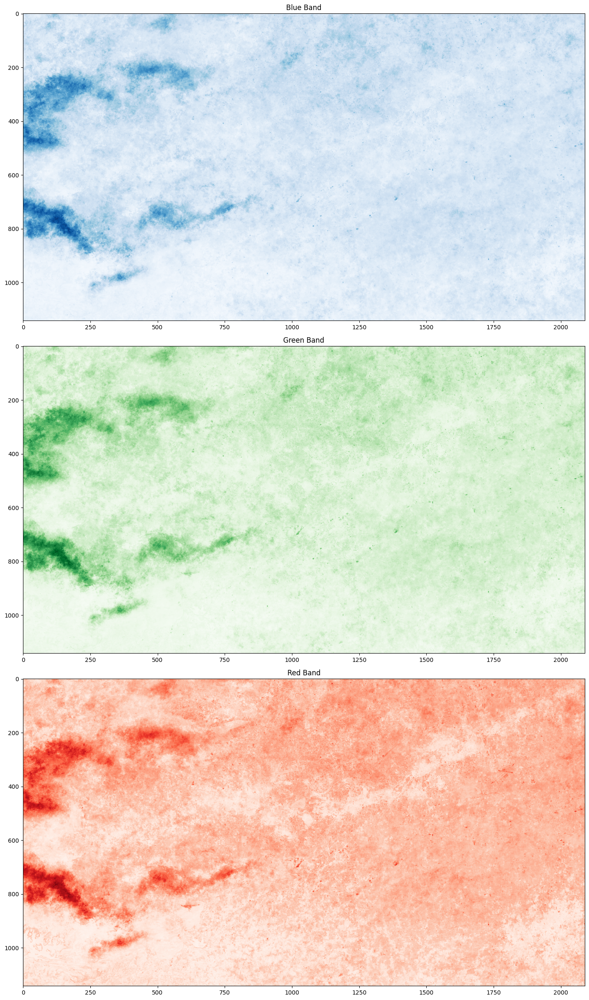

In [34]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np

# Open the image
with rasterio.open('Composite_Coimbatore_rect.tif') as src:
    # Read the bands of the image
    band1 = src.read(2)  # Blue band
    band2 = src.read(3)  # Green band
    band3 = src.read(4)  # Red band
    
# Create a figure with 3 subplots
fig, axs = plt.subplots(3, 1, figsize=(15, 24))

# Display each band in a separate subplot
axs[0].imshow(band1, cmap='Blues')
axs[0].set_title('Blue Band')

axs[1].imshow(band2, cmap='Greens')
axs[1].set_title('Green Band')

axs[2].imshow(band3, cmap='Reds')
axs[2].set_title('Red Band')

# Show the plots
plt.tight_layout()
plt.show()

In [160]:
from PIL import Image
img = Image.open('Sentinel_NDVI_Coimbatore.tif')
# Print the color space
print(f'Color space: {img.mode}')

Color space: F
